In [1]:
# Import other modules not related to PySpark
import os 
import sys   
import pandas as pd
from pandas import DataFrame 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick  
import matplotlib 
from mpl_toolkits.mplot3d import Axes3D
import math
from IPython.core.interactiveshell import InteractiveShell
from datetime import *
import statistics as stats
# This helps auto print out the items without explixitly using 'print'
InteractiveShell.ast_node_interactivity = "all" 
%matplotlib inline

# Import PySpark related modules
import pyspark
from pyspark.rdd import RDD
from pyspark.sql import Row 
from pyspark.sql import DataFrame
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.sql import functions
from pyspark.sql.functions import lit, desc, col, size, array_contains\
, isnan, udf, hour, array_min, array_max, countDistinct
from pyspark.sql.types import *


# Import PySpark related modules
import pyspark
from pyspark.rdd import RDD
from pyspark.sql import Row 
from pyspark.sql import DataFrame
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.sql import functions
from pyspark.sql.functions import lit, desc, col, size, array_contains\
, isnan, udf, hour, array_min, array_max, countDistinct
from pyspark.sql.types import *


from pyspark.sql.functions import udf, col, when, to_date, to_timestamp
from pyspark.sql.types import StringType, TimestampType
from datetime import datetime, timedelta 



 
MAX_MEMORY = '10G'
# Initialize a spark session.
conf = pyspark.SparkConf().setMaster("local[*]") \
        .set('spark.executor.heartbeatInterval', 10000) \
        .set('spark.network.timeout', 10000) \
        .set("spark.core.connection.ack.wait.timeout", "3600") \
        .set("spark.executor.memory", MAX_MEMORY) \
        .set("spark.driver.memory", MAX_MEMORY)
def init_spark():
    spark = SparkSession \
        .builder \
        .appName("ITsm") \
        .config(conf=conf) \
        .getOrCreate()
    return spark

spark = init_spark()
# spark = SparkSession.builder.master("local").appName("ITsm").getOrCreate()
# sc = spark.sparkContext
# sc  

In [3]:
df_ticket = pd.read_csv('incident.csv')
df_ticket['STATUS'].value_counts() 

-Annulation utilisateur             432440
-Clôturé automatiquement              7922
-Clôturé                              2581
-En cours                             1439
-Résolu                                 81
-Suspendu                               29
-En attente de montée de version        22
-Redirigé                               21
-Incident lié                            8
-Refus de la solution                    6
-Réouvert                                1
Name: STATUS, dtype: int64

In [7]:
df_ticket = pd.read_csv('ticket.csv')
df_ticket['TICKET_TYPE'].value_counts()

Non Qualifi�    178675
Incident        163861
Assistance      102014
Name: TICKET_TYPE, dtype: int64

In [4]:
dffff = pd.read_csv('../merged4_clean_1.csv')

In [5]:
dffff

,Group_ID,Numero ticket,Breve description,Date de creation,Duree de premier prise en charge,Date de resolution,Max Resolution Date,Type de ticket,Cause reelle,Action Name,Intervenant,Code Appli,Groupe,Priorite,Beneficiaire,Date de creation de laction en cours,Date de prise en charge de laction en cours,Statut
0,7313.0,I171107_0210,NaN,2017-11-07 15:08:00,NaN,2017-11-13 09:04:00,2017-11-22,Non Qualifi�,Param�trage erron�,No Action,"El haddad, Marouan",SFF,SFF - Team SFF,3.0,M00698,NaN,NaN,-Annulation utilisateur
1,7313.0,I180604_0331,NaN,2018-06-04 20:05:00,NaN,2018-08-16 14:51:00,2018-06-06,Non Qualifi�,DAST,No Action,"El haddad, Marouan",SFF,SFF - Team SFF,3.0,M01453,NaN,NaN,-Annulation utilisateur
2,7313.0,I181004_0051,NaN,2018-10-04 08:28:00,NaN,2018-10-04 09:01:00,2018-10-18,Non Qualifi�,Manque d'information,No Action,"El haddad, Marouan",SFF,SFF - Team SFF,3.0,M29029,NaN,NaN,-Annulation utilisateur
3,7313.0,I190503_0172,Install DLL sur les VM de CapGemini � Casablanca,2019-05-03 13:28:00,NaN,2019-06-27 16:01:00,2019-05-20,Non Qualifi�,Cas non pr�vu - �volution,No Action,"El haddad, Marouan",SFF,SFF - Team SFF,3.0,M91420,NaN,NaN,-Annulation utilisateur
4,4800.0,I200124_0077,pret tourisme,2020-01-24 09:50:00,NaN,2020-09-13 14:43:00,2020-02-07,Non Qualifi�,NaN,No Action,"Dur, Marie claire",SBF,COF ESB - FINANCEMENT METIER,3.0,M21523,NaN,NaN,-Annulation utilisateur
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444545,7288.0,I220512_0221,NaN,2022-05-12 14:54:00,1472.0,2022-05-17 13:11:00,2022-05-18,Incident,Anomalie technique,No Action,"Savarin, David",CDG,FPA - Anaplan Budget & Charges,3.0,M46054,NaN,2022-05-13 15:26:00,-Annulation utilisateur
444546,7288.0,I221207_0301,NaN,2022-12-07 15:44:00,28.0,2022-12-07 16:58:00,2022-12-08,Incident,Anomalie fonctionnelle,No Action,"Savarin, David",PPR,FPA - Anaplan Budget & Charges,3.0,M28678,NaN,2022-12-07 16:12:00,-Annulation utilisateur
444547,7288.0,I231013_0280,J4TAP4KA Alimentation des r�f�rentiel,2023-10-13 15:35:00,NaN,2023-10-17 07:38:00,2023-10-16,Incident,Anomalie technique,No Action,"Savarin, David",PPR,FPA - Anaplan Budget & Charges,3.0,M68460,NaN,NaN,-Annulation utilisateur
444548,7288.0,I240104_0005,J4KOD9MA CRF_CDG_OD_ALIM_COMPTOIR,2024-01-04 06:04:00,NaN,NaN,2024-01-04,Incident,NaN,Traitement de l'incident,"Savarin, David",CDG,FPA - Anaplan Budget & Charges,3.0,M10112,NaN,NaN,-En cours


In [7]:
for value in df_ticket['CREATION_DATE'] : 
    print(value) 

2017-11-07 15:08:00
2018-06-04 20:05:00
2018-10-04 08:28:00
2019-05-03 13:28:00
2020-01-24 09:50:00
2020-01-27 08:58:00
2020-04-15 08:07:00
2020-05-05 06:33:00
2020-06-02 15:52:00
2020-09-07 23:34:00
2020-11-17 09:48:00
2021-09-01 14:07:00
2022-01-14 15:57:00
2022-02-28 08:01:00
2022-03-06 07:32:00
2023-06-19 06:14:00
2016-07-26 14:02:00
2016-10-20 12:14:00
2016-12-09 16:14:00
2017-04-13 12:11:00
2017-07-12 14:04:00
2018-03-19 10:55:00
2018-05-03 10:24:00
2018-05-24 14:30:00
2018-06-07 06:34:00
2018-06-07 07:27:00
2018-06-11 07:32:00
2018-06-23 01:40:00
2018-09-05 23:35:00
2018-09-06 00:12:00
2018-10-12 01:39:00
2018-10-12 06:57:00
2018-11-19 14:26:00
2018-11-24 01:44:00
2018-12-06 08:30:00
2019-01-02 11:25:00
2019-01-17 04:20:00
2019-01-28 19:53:00
2019-03-26 17:50:00
2019-04-03 03:32:00
2019-04-05 15:36:00
2019-04-30 01:25:00
2019-06-21 00:21:00
2019-06-24 08:07:00
2019-06-27 00:13:00
2019-07-19 00:49:00
2019-08-19 21:43:00
2019-08-27 00:04:00
2019-10-02 08:16:00
2019-11-06 23:57:00


In [5]:
df_ticket.dtypes

TICKET_ID                     object
TICKET_TYPE                   object
CREATION_DATE                 object
END_DATE                      object
DESC_COURTE                   object
MAX_RESOLUTION_DATE           object
DUREE_PEC                    float64
BENEF_ID                      object
INTERV_NAME                   object
Group_ID                     float64
Resolution Time (Minutes)    float64
Delay resolution (Days)      float64
dtype: object

In [4]:
df_ticket.columns 

Index(['TICKET_ID', 'TICKET_TYPE', 'CREATION_DATE', 'END_DATE', 'DESC_COURTE',
       'MAX_RESOLUTION_DATE', 'DUREE_PEC', 'BENEF_ID', 'INTERV_NAME',
       'Group_ID', 'Resolution Time (Minutes)', 'Delay resolution (Days)'],
      dtype='object')

<Figure size 720x360 with 0 Axes>

<AxesSubplot:xlabel='CREATION_DATE'>

Text(0.5, 1.0, 'Ticket Counts by Date')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Number of Tickets')

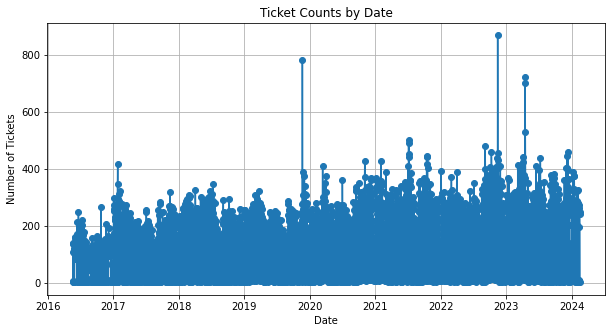

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

df_ticket['CREATION_DATE'] = pd.to_datetime(df_ticket['CREATION_DATE'])

# Group by date and count tickets
ticket_counts = df_ticket.groupby(df_ticket['CREATION_DATE'].dt.date).size()

# Plotting
plt.figure(figsize=(10, 5))
ticket_counts.plot(kind='line', marker='o')
plt.title('Ticket Counts by Date')
plt.xlabel('Date')
plt.ylabel('Number of Tickets')
plt.grid(True)
plt.show()
